In [1]:
import cv2
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt

In [2]:
img = cv2.imread('bereshit1/01-02.0000003.jpg')

(5150, 3275, 3)


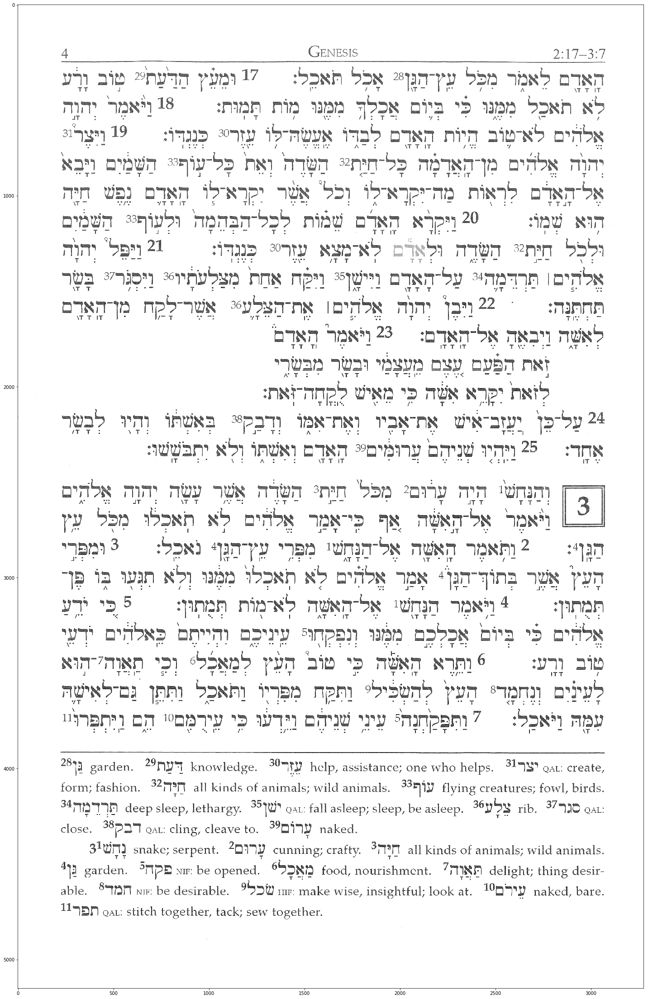

In [11]:
x = 140
y = 110
width = 3275
height = 5150
cropped = img[y:y+height, x:x+width]
print(np.shape(cropped))
plt.rcParams["figure.figsize"] = (200, 40)
plt.imshow(cropped)
plt.show()

In [136]:
img = cv2.imread('cut/01-02.0000007.jpg')
gray = cv2.cvtColor(img.copy(), cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray.copy(), 225, 255, cv2.THRESH_BINARY_INV)[1]
edges = cv2.Canny(gray, 10, 250, apertureSize=7)

In [137]:
(_, cnts, hier) = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

In [138]:
# Get the lines. (= long contours > 600)
lines = []
for c in cnts:
    epsilon = 0.1*cv2.arcLength(c,True)
    approx = cv2.approxPolyDP(c,epsilon,True)
    if cv2.arcLength(c, True) > 600.0:
        lines.append(c)
len(lines)

2

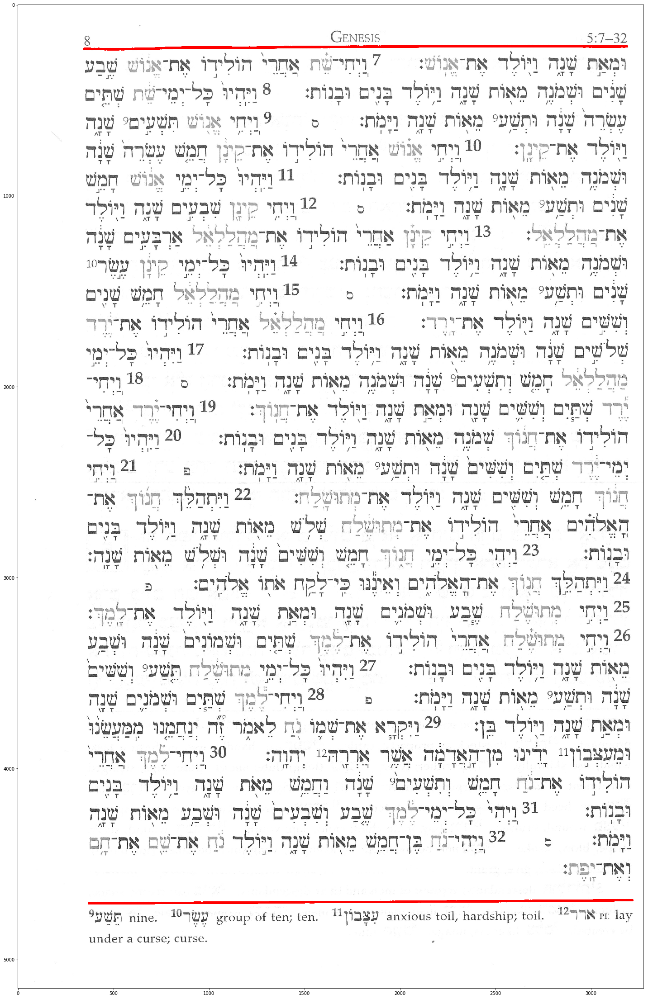

In [139]:
cnt = np.array(lines)
wc = cv2.drawContours(img.copy(), cnt, -1, (255, 0, 0), 7)
plt.rcParams["figure.figsize"] = (200, 40)
plt.imshow(wc)
plt.show()

In [140]:
print(min(lines[0][:,0][:,0]), max(lines[0][:,0][:,0]))
print(min(lines[0][:,0][:,1]), max(lines[0][:,0][:,1]))
print(min(lines[1][:,0][:,0]), max(lines[1][:,0][:,0]))
print(min(lines[1][:,0][:,1]), max(lines[1][:,0][:,1]))

371 3218
4687 4708
346 3190
214 236


In [141]:
leftmost0 = min(lines[0][:,0], key = lambda x : x[0])
leftmost1 = min(lines[1][:,0], key = lambda x : x[0])

topindex = 0 if leftmost0[0] < leftmost1[0] else 1
topleft = min(lines[topindex][:,0], key = lambda x : x[0])
topright = max(lines[topindex][:,0], key = lambda x : x[0])

margin = 10
x1 = topleft[0] - margin
x2 = topright[0] + margin
#y1 = (topleft[1] if topleft[1] < topright[1] else topright[1]) - margin
y1 = 0
y2 = (topright[1] if topright[1] > topleft[1] else topleft[1]) + margin

print(topleft)
print(topright)
print(x1, y1, x2, y2)

[346 230]
[3190  221]
336 0 3200 240


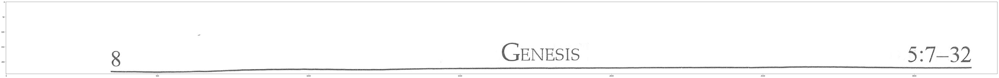

In [142]:
cut = img[0:240]
plt.rcParams["figure.figsize"] = (100, 80)
plt.imshow(cut)
plt.show()

In [145]:
edges = cv2.Canny(cut, 50, 150, apertureSize=3)
cutlines = cv2.HoughLines(edges, 1, np.pi/180, 600)
print(cutlines.shape)
print(cutlines)

(2, 1, 2)
[[[219.          1.5707964]]

 [[223.          1.5707964]]]


-3275 218 3274 219
-3275 222 3274 223


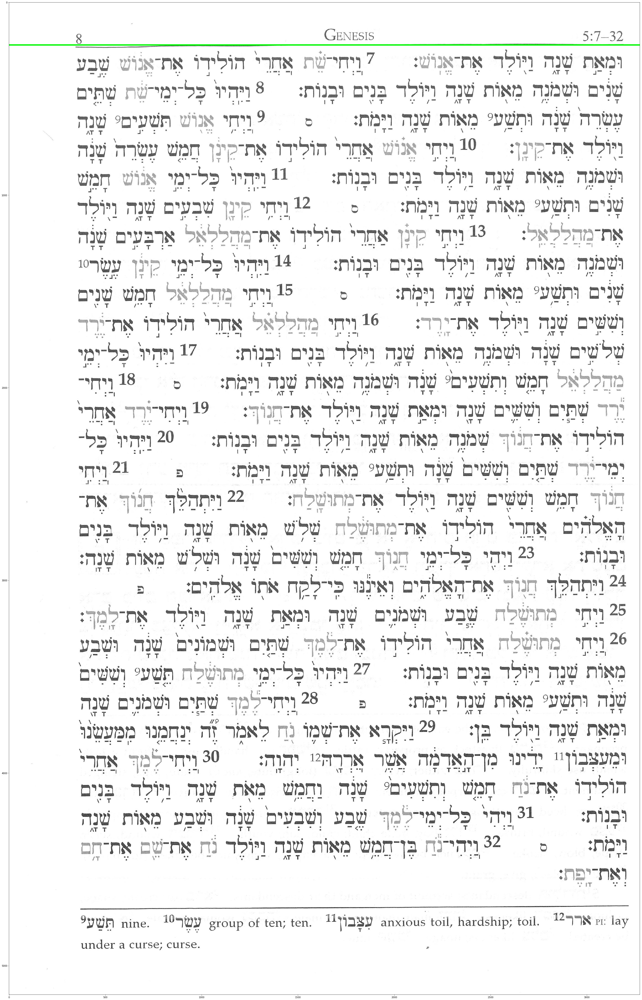

In [146]:
maxlength = img.shape[:2][1]
for line in cutlines:
    for rho,theta in line:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a*rho
        y0 = b*rho
        x1 = int(x0 + maxlength*(-b))
        y1 = int(y0 + maxlength*(a))
        x2 = int(x0 - maxlength*(-b))
        y2 = int(y0 - maxlength*(a))
        print(x1, y1, x2, y2)

        cv2.line(img,(x1,y1),(x2,y2),(0,255,0), 2)
plt.imshow(img)
plt.show()